# Preparación de los conjuntos

In [1]:
import shutil

In [ ]:
from google.colab import files
import json

# Función para cargar un archivo JSON
def cargar_json():
    # Subir el archivo JSON
    uploaded = files.upload()

    # Obtener el nombre del archivo
    file_name = list(uploaded.keys())[0]

    # Cargar el contenido del archivo JSON
    with open(file_name, 'r') as file:
        data = json.load(file)

    return data

# Función para mostrar información selectiva sobre el JSON
def mostrar_informacion_selectiva(data, keys_to_display=None, max_items=5):
    print("Contenido del JSON (primeros {} elementos):".format(max_items))

    # Mostrar solo algunas claves específicas o todas si no se especifica ninguna
    keys_to_display = keys_to_display or list(data.keys())

    for key in keys_to_display:
        if key in data:
            print(f"{key}: {data[key]}")

    print("\nInformación sobre el JSON:")
    print("Número total de elementos:", len(data))
    print("Tipo de datos:", type(data))
    print("Claves:", list(data.keys()))

In [ ]:
'''
# Cargar el JSON
instance_train = cargar_json()

# Especificar las claves que te gustaría mostrar o dejar como None para mostrar todas las claves
claves_a_mostrar = ["clave1", "clave2", "clave3"]

# Mostrar información selectiva sobre el JSON
mostrar_informacion_selectiva(instance_train, keys_to_display=claves_a_mostrar)
'''

'\n# Cargar el JSON\ninstance_train = cargar_json()\n\n# Especificar las claves que te gustaría mostrar o dejar como None para mostrar todas las claves\nclaves_a_mostrar = ["clave1", "clave2", "clave3"]\n\n# Mostrar información selectiva sobre el JSON\nmostrar_informacion_selectiva(instance_train, keys_to_display=claves_a_mostrar)\n'

In [ ]:
'''
# Cargar el JSON
instance_val = cargar_json()

# Especificar las claves que te gustaría mostrar o dejar como None para mostrar todas las claves
claves_a_mostrar = ["clave1", "clave2", "clave3"]

# Mostrar información selectiva sobre el JSON
mostrar_informacion_selectiva(instance_val, keys_to_display=claves_a_mostrar)
'''

In [ ]:
'''
print(instance_val['images'][1])
print(len(instance_val['images']))
'''

In [ ]:
'''
print(instance_val['annotations'][1])
print(len(instance_val['annotations']))
'''

In [2]:
from google.colab import drive

# Monta Google Drive en el directorio '/content/drive'
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os

# Ruta del directorio principal
base_directory = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset'

# Nombre de la carpeta que deseas crear
folder_name = 'val'

# Ruta completa de la carpeta a crear
folder_path = os.path.join(base_directory, folder_name)

# Verificar si la carpeta ya existe o no
if not os.path.exists(folder_path):
    # Crear la carpeta si no existe
    os.makedirs(folder_path)
    print(f'Se ha creado la carpeta {folder_name} en {base_directory}')
else:
    print(f'La carpeta {folder_name} ya existe en {base_directory}')


La carpeta val ya existe en /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset


In [4]:
import os

# Ruta del directorio principal
base_directory = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val'

# Nombre de la carpeta que deseas crear
folder_name_images = 'images'
folder_name_masks = 'masks'


# Ruta completa de la carpeta a crear
folder_path_images = os.path.join(base_directory, folder_name_images)
folder_path_masks = os.path.join(base_directory, folder_name_masks)


# Verificar si la carpeta ya existe o no
if not os.path.exists(folder_path_images):
    # Crear la carpeta si no existe
    os.makedirs(folder_path_images)
    print(f'Se ha creado la carpeta {folder_name_images} en {base_directory}')
else:
    print(f'La carpeta {folder_name_images} ya existe en {base_directory}')


# Verificar si la carpeta ya existe o no
if not os.path.exists(folder_path_masks):
    # Crear la carpeta si no existe
    os.makedirs(folder_path_masks)
    print(f'Se ha creado la carpeta {folder_name_masks} en {base_directory}')
else:
    print(f'La carpeta {folder_name_masks} ya existe en {base_directory}')


La carpeta images ya existe en /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val
La carpeta masks ya existe en /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val


In [ ]:
instance_train = cargar_json()

Saving instances_train.json to instances_train.json


In [ ]:
instance_val = cargar_json()

Saving instances_val.json to instances_val.json


In [ ]:
import os
import shutil


source_directory_images = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/images'
source_directory_masks = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/masks'

destination_directory_images = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images'
destination_directory_masks = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/masks'

len_val = len(instance_val['images'])

for i in range(len_val):
    val_image = instance_val['images'][i]['file_name']
    source_path_images = os.path.join(source_directory_images, val_image)
    source_path_masks = os.path.join(source_directory_masks, val_image)

    destination_path_images = os.path.join(destination_directory_images, val_image)
    destination_path_masks = os.path.join(destination_directory_masks, val_image)

    # Verificar si el archivo ya existe en el directorio de destino
    if not os.path.exists(destination_path_images) and not os.path.exists(destination_path_masks):
        # Mover el archivo solo si no existe en el directorio de destino
        shutil.move(source_path_images, destination_path_images)
        shutil.move(source_path_masks, destination_path_masks)

        print(f'Se ha movido el archivo {val_image} de {source_directory_images} a {destination_directory_images}')
        print(f'Se ha movido el archivo {val_image} de {source_directory_masks} a {destination_directory_masks}')
    else:
        print(f'El archivo {val_image} ya existe en {destination_directory_images} y {destination_directory_masks}. No se ha movido.')


El archivo 20150919_174151_image381.png ya existe en /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images y /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/masks. No se ha movido.
El archivo 20150921_131729_image11.png ya existe en /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images y /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/masks. No se ha movido.
El archivo 20150919_174730_image861.png ya existe en /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images y /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/masks. No se ha movido.
El archivo 20150921_131346_image966.png ya existe en /content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images y /content/drive/MyDrive/Procesamiento avanzado de im

In [3]:
!pip install -U openmim
!mim install mmengine
!mim install "mmcv>=2.0.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.9/298.9 kB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 16.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.4/239.4 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.1/953.1 kB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 13.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.0/94.0 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━

Looking in links: https://download.openmmlab.com/mmcv/dist/cu121/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.4/450.4 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 10.7 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu121/torch2.1.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.1/94.1 MB 8.8 MB/s eta 0:00:00


In [4]:
# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -v -e .

Cloning into 'mmdetection'...
remote: Enumerating objects: 37923, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 37923 (delta 0), reused 1 (delta 0), pack-reused 37917
Receiving objects: 100% (37923/37923), 63.18 MiB | 25.38 MiB/s, done.
Resolving deltas: 100% (26149/26149), done.
/content/mmdetection
Using pip 23.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
Obtaining file:///content/mmdetection
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-ijd34tz2/mmdet.egg-info
  writing manifest file '/tmp/pip-pip-egg-info-ijd34tz2/mmdet.egg-info/SOURCES.txt'
  writing manifest file '/tmp/pip-pip-egg-info-ijd34tz2/mmdet.egg-info/SOURCES.txt'
  Preparing metadata (setup.py) ... done
  Running setup.py develop for mmdet
    Running command python setup.py develop
    running develop
    /usr/local/lib/python3.10/dist-packages/setuptools/command/easy_install.py:156: Ea

In [5]:
!pwd

/content/mmdetection


In [ ]:
# Check Pytorch installation
import torch, torchvision
print("torch version:",torch.__version__, "cuda:",torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print("mmdetection:",mmdet.__version__)

# Check mmcv installation
import mmcv
print("mmcv:",mmcv.__version__)

# Check mmengine installation
import mmengine
print("mmengine:",mmengine.__version__)

torch version: 2.1.0+cu121 cuda: True
mmdetection: 3.2.0
mmcv: 2.1.0
mmengine: 0.10.2


In [6]:
!mim download mmdet --config mask-rcnn_swin-t-p4-w7_fpn_1x_coco --dest ./checkpoints

processing mask-rcnn_swin-t-p4-w7_fpn_1x_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.6/182.6 MiB 5.5 MB/s eta 0:00:00
Successfully downloaded mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth to /content/mmdetection/checkpoints
Successfully dumped mask-rcnn_swin-t-p4-w7_fpn_1x_coco.py to /content/mmdetection/checkpoints


In [ ]:
import mmcv
import mmengine
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
# Choose to use a config and initialize the detector
config_file = 'configs/swin/mask-rcnn_swin-t-p4-w7_fpn_1x_coco.py'
# Setup a checkpoint file to load
checkpoint_file = 'checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth'

# register all modules in mmdet into the registries
register_all_modules()

# build the model from a config file and a checkpoint file
#model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or device='cuda:0'

try:
    model = init_detector(config_file, checkpoint_file, device='cuda:0')
    print("Modelo inicializado en GPU.")
except RuntimeError as e:
    # Si hay un error, intenta inicializar el modelo en CPU
    print(f"Error al inicializar en GPU: {e}")
    print("Intentando inicializar en CPU.")
    model = init_detector(config_file, checkpoint_file, device='cpu')
    print("Modelo inicializado en CPU.")

Loads checkpoint by local backend from path: checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth
Modelo inicializado en GPU.


In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1141.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    batch_input_shape: (1344, 768)
    img_shape: (1333, 750)
    scale_factor: (1.0416666666666667, 1.04140625)
    ori_shape: (1280, 720)
    img_id: 0
    img_path: None
    pad_shape: (1344, 768)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
        ) at 0x795b3afbae30>
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([47, 32, 47, 47, 47, 47, 58, 47, 58], device='cuda:0')
            masks: tensor([[[False, False, False,  ..., False, False, False],
                         [False, False, False,  ..., False, False, False],
                         [False, False, False,  ..., False, False, Fal

In [ ]:
from mmdet.registry import VISUALIZERS
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


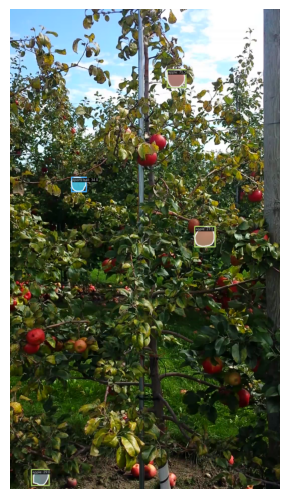

In [ ]:
# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.2
)
visualizer.show()

In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1081.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    ori_shape: (1280, 720)
    img_id: 0
    scale_factor: (1.0416666666666667, 1.04140625)
    img_shape: (1333, 750)
    batch_input_shape: (1344, 768)
    pad_shape: (1344, 768)
    img_path: None

    DATA FIELDS
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([47, 47, 14, 32, 47, 47, 32, 32, 47, 58, 47, 58, 58, 58, 58, 47, 47, 77,
                        47, 46])
            bboxes: tensor([[ 391.2021,  100.1362,  433.7234,  148.1763],
                        [ 207.0109,  601.7847,  262.0671,  647.1199],
                        [  39.5247,  794.5834,  100.1315,  866.4718],
                        [ 500.9422, 1098.2740,  532.4033, 1132.1443],
                        [ 455.7057,  496.2678,  486.5469,  536.4145],
                        [ 474.6324,  515.9341,  525.6056,  566.6447],
                        [ 306.5779, 1142.5531,  330.9922, 1183.6088],
            

In [ ]:
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

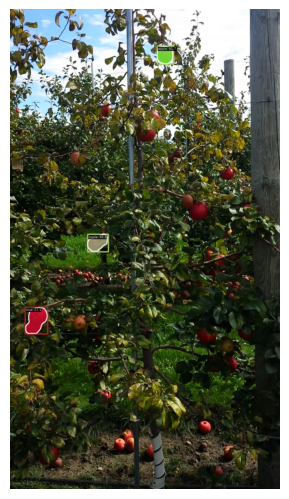

In [ ]:
# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.2
)
visualizer.show()

In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    ori_shape: (1280, 720)
    img_id: 0
    scale_factor: (1.0416666666666667, 1.04140625)
    img_shape: (1333, 750)
    batch_input_shape: (1344, 768)
    pad_shape: (1344, 768)
    img_path: None

    DATA FIELDS
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([32, 47, 39, 47])
            bboxes: tensor([[ 428.5825,  399.2290,  455.4625,  433.9238],
                        [ 428.8267,  399.4604,  454.2390,  433.7823],
                        [ 473.3050, 1209.4274,  524.1179, 1260.0679],
                        [ 345.1889,  805.8907,  382.1895,  834.6730]])
            scores: tensor([0.5245, 0.2102, 0.1289, 0.0625])
            masks: tensor([[[False, False, False,  ..., False, False, False],
                         [False, False, False,  ..., False, False, False],
                         [False, False, False,  ..., False, False, False],
                    

In [ ]:
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

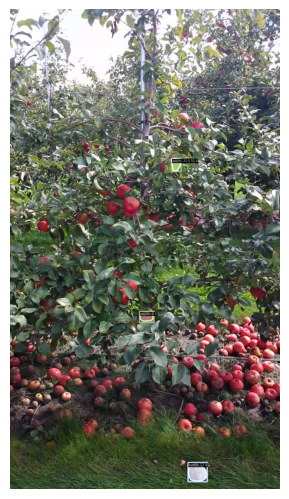

In [ ]:
# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.001
)
visualizer.show()

In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1021.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    ori_shape: (1280, 720)
    img_id: 0
    scale_factor: (1.0416666666666667, 1.04140625)
    img_shape: (1333, 750)
    batch_input_shape: (1344, 768)
    pad_shape: (1344, 768)
    img_path: None

    DATA FIELDS
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([32, 47, 32, 47, 47, 47, 32, 58, 32, 47, 47, 58, 58, 47])
            bboxes: tensor([[ 593.0417, 1087.3726,  625.4403, 1121.0006],
                        [ 380.1084, 1125.9557,  408.6992, 1157.9225],
                        [ 461.3437, 1140.1526,  489.7787, 1180.2318],
                        [ 405.9355, 1124.3485,  442.1850, 1167.4125],
                        [ 580.2851,  528.0334,  630.1317,  577.5269],
                        [ 380.4983, 1104.7738,  437.0962, 1165.7726],
                        [ 549.5139,  511.3230,  592.6869,  545.4559],
                        [ 456.6154,  705.0928,  720.0000, 12

In [ ]:
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

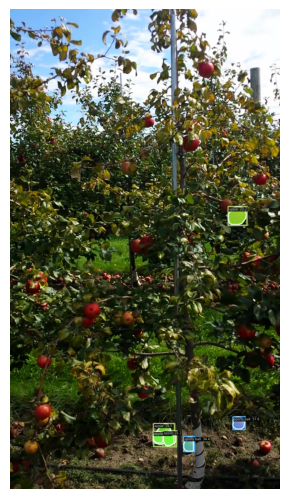

In [ ]:
# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.1
)
visualizer.show()

In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1051.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    ori_shape: (1280, 720)
    img_id: 0
    scale_factor: (1.0416666666666667, 1.04140625)
    img_shape: (1333, 750)
    batch_input_shape: (1344, 768)
    pad_shape: (1344, 768)
    img_path: None

    DATA FIELDS
    pred_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([32, 77, 47, 32, 77, 77, 47, 77, 58, 47, 58, 32, 47, 47, 41, 32, 47, 58,
                        47])
            bboxes: tensor([[ 582.0041, 1087.9139,  614.3093, 1122.9984],
                        [ 350.5999, 1115.1500,  420.5511, 1173.3209],
                        [ 264.8393,  813.8481,  296.7926,  854.8751],
                        [ 247.9561,  412.1471,  291.1129,  449.4536],
                        [ 385.9443, 1113.1542,  425.3250, 1170.1836],
                        [ 347.6275, 1107.1296,  475.0822, 1185.8234],
                        [ 451.9254,  135.6172,  494.5984,  182.7783],
                

In [ ]:
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

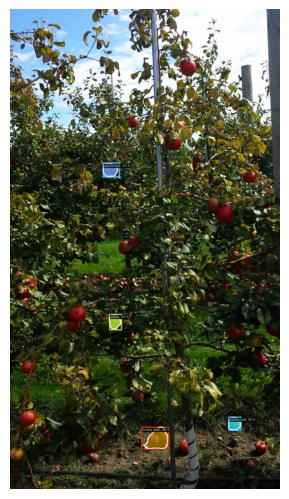

In [ ]:
# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.2
)
visualizer.show()

# Modelo preentrenado en MMDetection

In [7]:
import os

# Ruta del directorio donde deseas crear la carpeta
directorio_mmdetection = '/content/mmdetection'

# Nombre de la carpeta que deseas crear
nombre_carpeta = 'minneappledataset'

# Ruta completa de la nueva carpeta
ruta_nueva_carpeta = os.path.join(directorio_mmdetection, nombre_carpeta)

# Verificar si la carpeta ya existe antes de intentar crearla
if not os.path.exists(ruta_nueva_carpeta):
    # Crear la carpeta
    os.makedirs(ruta_nueva_carpeta)
    print(f'Carpeta "{nombre_carpeta}" creada en {directorio_mmdetection}')
else:
    print(f'La carpeta "{nombre_carpeta}" ya existe en {directorio_mmdetection}')


Carpeta "minneappledataset" creada en /content/mmdetection


In [8]:
import os

# Ruta del directorio donde deseas crear la carpeta
directorio_mmdetection = '/content/mmdetection/minneappledataset'

# Nombre de la carpeta que deseas crear
nombre_carpeta = 'minneapple'

# Ruta completa de la nueva carpeta
ruta_nueva_carpeta = os.path.join(directorio_mmdetection, nombre_carpeta)

# Verificar si la carpeta ya existe antes de intentar crearla
if not os.path.exists(ruta_nueva_carpeta):
    # Crear la carpeta
    os.makedirs(ruta_nueva_carpeta)
    print(f'Carpeta "{nombre_carpeta}" creada en {directorio_mmdetection}')
else:
    print(f'La carpeta "{nombre_carpeta}" ya existe en {directorio_mmdetection}')


Carpeta "minneapple" creada en /content/mmdetection/minneappledataset


In [9]:
import os

# Ruta del directorio donde deseas crear la carpeta
directorio_mmdetection = '/content/mmdetection/minneappledataset/minneapple'

# Nombre de la carpeta que deseas crear
nombre_carpeta = 'train'

# Ruta completa de la nueva carpeta
ruta_nueva_carpeta = os.path.join(directorio_mmdetection, nombre_carpeta)

# Verificar si la carpeta ya existe antes de intentar crearla
if not os.path.exists(ruta_nueva_carpeta):
    # Crear la carpeta
    os.makedirs(ruta_nueva_carpeta)
    print(f'Carpeta "{nombre_carpeta}" creada en {directorio_mmdetection}')
else:
    print(f'La carpeta "{nombre_carpeta}" ya existe en {directorio_mmdetection}')


# Ruta del directorio donde deseas crear la carpeta
directorio_mmdetection = '/content/mmdetection/minneappledataset/minneapple'

# Nombre de la carpeta que deseas crear
nombre_carpeta = 'val'

# Ruta completa de la nueva carpeta
ruta_nueva_carpeta = os.path.join(directorio_mmdetection, nombre_carpeta)

# Verificar si la carpeta ya existe antes de intentar crearla
if not os.path.exists(ruta_nueva_carpeta):
    # Crear la carpeta
    os.makedirs(ruta_nueva_carpeta)
    print(f'Carpeta "{nombre_carpeta}" creada en {directorio_mmdetection}')
else:
    print(f'La carpeta "{nombre_carpeta}" ya existe en {directorio_mmdetection}')


Carpeta "train" creada en /content/mmdetection/minneappledataset/minneapple
Carpeta "val" creada en /content/mmdetection/minneappledataset/minneapple


In [10]:
# Rutas de origen y destino
ruta_origen = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/images'
ruta_destino = '/content/mmdetection/minneappledataset/minneapple/train'

# Verificar si la carpeta de destino existe
if not os.path.exists(ruta_destino):
    os.makedirs(ruta_destino)

# Obtener la lista de archivos en la carpeta de origen
archivos_a_copiar = [archivo for archivo in os.listdir(ruta_origen) if os.path.isfile(os.path.join(ruta_origen, archivo))]

# Copiar cada archivo a la carpeta de destino si no existe en el destino
for archivo in archivos_a_copiar:
    ruta_archivo_origen = os.path.join(ruta_origen, archivo)
    ruta_archivo_destino = os.path.join(ruta_destino, archivo)

    # Verificar si el archivo no existe en el destino antes de copiar
    if not os.path.exists(ruta_archivo_destino):
        shutil.copy(ruta_archivo_origen, ruta_archivo_destino)
        print(f'Archivo copiado de "{ruta_origen}" a "{ruta_destino}": {archivo}')
    else:
        print(f'El archivo ya existe en "{ruta_destino}": {archivo}')

print('Proceso completado.')


Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/images" a "/content/mmdetection/minneappledataset/minneapple/train": 20150921_131234_image61.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/images" a "/content/mmdetection/minneappledataset/minneapple/train": 20150921_131234_image11.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/images" a "/content/mmdetection/minneappledataset/minneapple/train": 20150921_131234_image91.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/images" a "/content/mmdetection/minneappledataset/minneapple/train": 20150921_131234_image451.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/train/images" a "/content/mmdetection/minneappledataset/m

In [11]:
# Rutas de origen y destino
ruta_origen = '/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images'
ruta_destino = '/content/mmdetection/minneappledataset/minneapple/val'

# Verificar si la carpeta de destino existe
if not os.path.exists(ruta_destino):
    os.makedirs(ruta_destino)

# Obtener la lista de archivos en la carpeta de origen
archivos_a_copiar = [archivo for archivo in os.listdir(ruta_origen) if os.path.isfile(os.path.join(ruta_origen, archivo))]

# Copiar cada archivo a la carpeta de destino si no existe en el destino
for archivo in archivos_a_copiar:
    ruta_archivo_origen = os.path.join(ruta_origen, archivo)
    ruta_archivo_destino = os.path.join(ruta_destino, archivo)

    # Verificar si el archivo no existe en el destino antes de copiar
    if not os.path.exists(ruta_archivo_destino):
        shutil.copy(ruta_archivo_origen, ruta_archivo_destino)
        print(f'Archivo copiado de "{ruta_origen}" a "{ruta_destino}": {archivo}')
    else:
        print(f'El archivo ya existe en "{ruta_destino}": {archivo}')

print('Proceso completado.')


Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images" a "/content/mmdetection/minneappledataset/minneapple/val": 20150921_131234_image626.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images" a "/content/mmdetection/minneappledataset/minneapple/val": 20150921_131234_image341.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images" a "/content/mmdetection/minneappledataset/minneapple/val": 20150921_131234_image676.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images" a "/content/mmdetection/minneappledataset/minneapple/val": 20150921_131234_image651.png
Archivo copiado de "/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/val/images" a "/content/mmdetection/minneappledataset/minneapple/val":

In [14]:
import shutil
import os

# Función para mover el archivo si no existe en la carpeta de destino
def move_if_not_exists(source_file, destination_folder):
    destination_file = os.path.join(destination_folder, os.path.basename(source_file))

    # Verificar si el archivo no existe en la carpeta de destino antes de mover
    if not os.path.exists(destination_file):
        # Mover el archivo
        shutil.move(source_file, destination_folder)
        print(f"El archivo {source_file} se ha movido a {destination_folder}.")
    else:
        print(f'El archivo ya existe en "{destination_folder}": {os.path.basename(source_file)}')

# Rutas de los archivos
source_file_train = '/content/instances_train.json'
destination_folder_train = '/content/mmdetection/minneappledataset/minneapple/train'
move_if_not_exists(source_file_train, destination_folder_train)

# Rutas de los archivos
source_file_val = '/content/instances_val.json'
destination_folder_val = '/content/mmdetection/minneappledataset/minneapple/val'
move_if_not_exists(source_file_val, destination_folder_val)


El archivo ya existe en "/content/mmdetection/minneappledataset/minneapple/train": instances_train.json
El archivo ya existe en "/content/mmdetection/minneappledataset/minneapple/val": instances_val.json


In [ ]:
import os

# Ruta de la carpeta de imágenes de entrenamiento
folder_path = '/content/mmdetection/minneappledataset/minneapple/train'

# Contador de imágenes
image_count = 0

# Recorre todos los archivos en la carpeta
for filename in os.listdir(folder_path):
    # Verifica si el archivo es una imagen (puedes ajustar las extensiones según tu necesidad)
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_count += 1

print(f"El número total de imágenes en {folder_path} es: {image_count}")

El número total de imágenes en /content/mmdetection/minneappledataset/minneapple/train es: 536


In [ ]:
import os

# Ruta de la carpeta de imágenes de entrenamiento
folder_path = '/content/mmdetection/minneappledataset/minneapple/val'

# Contador de imágenes
image_count = 0

# Recorre todos los archivos en la carpeta
for filename in os.listdir(folder_path):
    # Verifica si el archivo es una imagen (puedes ajustar las extensiones según tu necesidad)
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_count += 1

print(f"El número total de imágenes en {folder_path} es: {image_count}")

El número total de imágenes en /content/mmdetection/minneappledataset/minneapple/val es: 134


In [ ]:
import json

def is_coco_format(json_data):
    try:
        # Verificar si el archivo tiene las claves y estructura típicas de COCO
        required_keys = ['images', 'annotations', 'categories']
        for key in required_keys:
            if key not in json_data:
                return False

        # Verificar si las claves 'id', 'image_id', 'category_id', 'bbox' están presentes en 'annotations'
        annotation_keys = json_data['annotations'][0].keys()
        annotation_required_keys = ['id', 'image_id', 'category_id', 'bbox']
        for key in annotation_required_keys:
            if key not in annotation_keys:
                return False

        # Si todo está bien, devuelve True
        return True

    except Exception as e:
        print(f"Error al verificar el formato COCO: {e}")
        return False

# Ruta a tu archivo JSON
json_path = '/content/mmdetection/minneappledataset/minneapple/train/instances_train.json'

# Cargar el archivo JSON
with open(json_path, 'r') as f:
    json_data = json.load(f)

# Verificar el formato COCO
if is_coco_format(json_data):
    print("El archivo JSON está en formato COCO.")
else:
    print("El archivo JSON no cumple con el formato COCO.")

# Ruta a tu archivo JSON
json_path = '/content/mmdetection/minneappledataset/minneapple/val/instances_val.json'

# Cargar el archivo JSON
with open(json_path, 'r') as f:
    json_data = json.load(f)

# Verificar el formato COCO
if is_coco_format(json_data):
    print("El archivo JSON está en formato COCO.")
else:
    print("El archivo JSON no cumple con el formato COCO.")

El archivo JSON está en formato COCO.
El archivo JSON está en formato COCO.


In [ ]:
from pycocotools.coco import COCO

# Path to load the COCO annotation file
annotation_file = '/content/mmdetection/minneappledataset/minneapple/train/instances_train.json'

# Initialise the COCO object
coco = COCO(annotation_file)

# Get all category tags and corresponding category IDs
categories = coco.loadCats(coco.getCatIds())
category_id_to_name = {cat['id']: cat['name'] for cat in categories}

# Print all category IDs and corresponding category names
for category_id, category_name in category_id_to_name.items():
    print(f"Category ID: {category_id}, Category Name: {category_name}")

loading annotations into memory...
Done (t=0.43s)
creating index...
index created!
Category ID: 1, Category Name: apple


In [12]:
from mmengine import Config
cfg = Config.fromfile('./configs/swin/mask-rcnn_swin-t-p4-w7_fpn_1x_coco.py')

In [13]:
from mmengine.runner import set_random_seed

# Modify dataset classes and color
cfg.metainfo = {
    'classes': ('apple', ),
    'palette': [
        (220, 20, 60),
    ]
}

# Modify dataset type and path
cfg.data_root = './minneappledataset/minneapple'

cfg.train_dataloader.dataset.ann_file = 'train/instances_train.json'
cfg.train_dataloader.dataset.data_root = cfg.data_root
cfg.train_dataloader.dataset.data_prefix.img = 'train/'
cfg.train_dataloader.dataset.metainfo = cfg.metainfo

cfg.val_dataloader.dataset.ann_file = 'val/instances_val.json'
cfg.val_dataloader.dataset.data_root = cfg.data_root
cfg.val_dataloader.dataset.data_prefix.img = 'val/'
cfg.val_dataloader.dataset.metainfo = cfg.metainfo

cfg.test_dataloader = cfg.val_dataloader

# Modify metric config
cfg.val_evaluator.ann_file = cfg.data_root+'/'+'val/instances_val.json'
cfg.test_evaluator = cfg.val_evaluator

# Modify num classes of the model in box head and mask head
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

# We can still the pre-trained Mask RCNN model to obtain a higher performance
cfg.load_from = 'checkpoints/mask_rcnn_swin-t-p4-w7_fpn_1x_coco_20210902_120937-9d6b7cfa.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './results'


# We can set the evaluation interval to reduce the evaluation times
cfg.train_cfg.val_interval = 3
# We can set the checkpoint saving interval to reduce the storage cost
cfg.default_hooks.checkpoint.interval = 3

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optim_wrapper.optimizer.lr = 0.002 / 8
cfg.model.backbone.drop_rate = 0.5
cfg.default_hooks.logger.interval = 10


# Set seed thus the results are more reproducible
# cfg.seed = 0
set_random_seed(0, deterministic=False)

# We can also use tensorboard to log the training process
cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})

#------------------------------------------------------
config=f'./configs/swin/mask-rcnn_swin-t-p4-w7_fpn_1x_coco.py'
with open(config, 'w') as f:
    f.write(cfg.pretty_text)

In [14]:
!python tools/train.py {config}

12/28 13:24:51 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 1676897776
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.2, V12.2.140
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_

In [15]:
%pip install tensorboard  -i https://mirrors.ustc.edu.cn/pypi/web/simple

Looking in indexes: https://mirrors.ustc.edu.cn/pypi/web/simple


In [16]:
# load tensorboard in jupyter notebook
%load_ext tensorboard

In [17]:
# see curves in tensorboard
# if you see <IPython.core.display.HTML object> please run it again
%tensorboard --logdir results/

<IPython.core.display.Javascript object>

In [ ]:
import mmcv
from mmdet.apis import init_detector, inference_detector
img = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1141.png',channel_order='rgb')
checkpoint_file = 'results/epoch_12.pth'
model = init_detector(cfg, checkpoint_file, device='cuda')
new_result = inference_detector(model, img)
print(new_result)

Loads checkpoint by local backend from path: results/epoch_12.pth
<DetDataSample(

    META INFORMATION
    img_shape: (1333, 750)
    img_path: None
    pad_shape: (1344, 768)
    img_id: 0
    ori_shape: (1280, 720)
    scale_factor: (1.0416666666666667, 1.04140625)
    batch_input_shape: (1344, 768)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x7829792c87f0>
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x7829792c87c0>
    pred_instanc

In [ ]:
import mmcv
import mmengine
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
# Choose to use a config and initialize the detector
# Setup a checkpoint file to load
checkpoint_file = 'results/epoch_12.pth'

# register all modules in mmdet into the registries
register_all_modules()

# build the model from a config file and a checkpoint file
#model = init_detector(config_file, checkpoint_file, device='cuda:0')  # or device='cuda:0'

try:
    model = init_detector(cfg, checkpoint_file, device='cuda:0')
    print("Modelo inicializado en GPU.")
except RuntimeError as e:
    # Si hay un error, intenta inicializar el modelo en CPU
    print(f"Error al inicializar en GPU: {e}")
    print("Intentando inicializar en CPU.")
    model = init_detector(config_file, checkpoint_file, device='cpu')
    print("Modelo inicializado en CPU.")

Loads checkpoint by local backend from path: results/epoch_12.pth
Modelo inicializado en GPU.


In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1141.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    img_shape: (1333, 750)
    img_path: None
    pad_shape: (1344, 768)
    img_id: 0
    ori_shape: (1280, 720)
    scale_factor: (1.0416666666666667, 1.04140625)
    batch_input_shape: (1344, 768)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x782989945e40>
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x782989944bb0>
    pred_instances: <InstanceData(
        
            META INFORMATION
        


In [ ]:
from mmdet.registry import VISUALIZERS
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.TensorboardVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


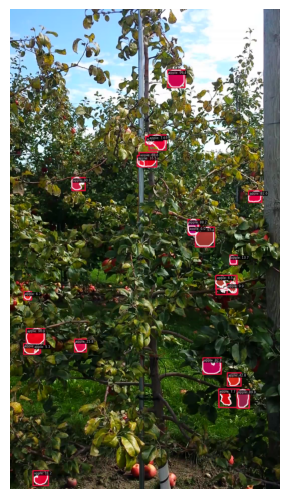

In [ ]:
# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.05
)
visualizer.show()

<DetDataSample(

    META INFORMATION
    img_shape: (1333, 750)
    img_path: None
    pad_shape: (1344, 768)
    img_id: 0
    ori_shape: (1280, 720)
    scale_factor: (1.0416666666666667, 1.04140625)
    batch_input_shape: (1344, 768)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297fe52f50>
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297fe53250>
    pred_instances: <InstanceData(
        
            META INFORMATION
        


/usr/local/lib/python3.10/dist-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


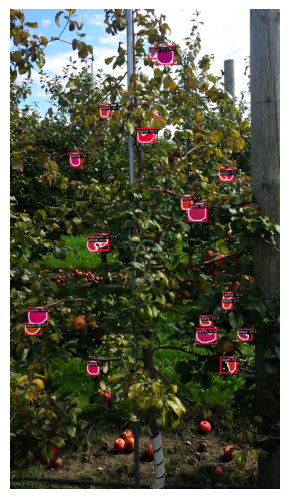

In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1081.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

from mmdet.registry import VISUALIZERS
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.05
)
visualizer.show()

In [ ]:
# Use the detector to do inference
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    img_shape: (1333, 750)
    img_path: None
    pad_shape: (1344, 768)
    img_id: 0
    ori_shape: (1280, 720)
    scale_factor: (1.0416666666666667, 1.04140625)
    batch_input_shape: (1344, 768)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297ffa6d10>
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297ffa6c20>
    pred_instances: <InstanceData(
        
            META INFORMATION
        


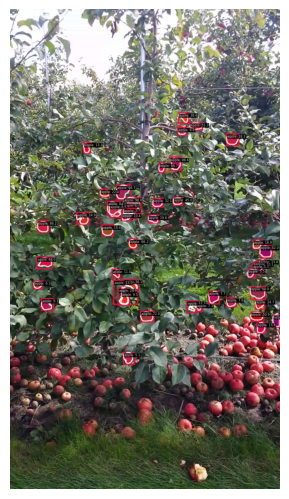

In [ ]:
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.05
)
visualizer.show()

In [ ]:
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1021.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    img_shape: (1333, 750)
    img_path: None
    pad_shape: (1344, 768)
    img_id: 0
    ori_shape: (1280, 720)
    scale_factor: (1.0416666666666667, 1.04140625)
    batch_input_shape: (1344, 768)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297fc19180>
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297fc1b8e0>
    pred_instances: <InstanceData(
        
            META INFORMATION
        


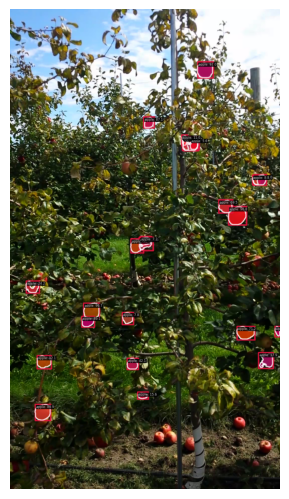

In [ ]:
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.05
)
visualizer.show()

In [ ]:
image = mmcv.imread('/content/drive/MyDrive/Procesamiento avanzado de imagenes/Proyecto final/appledataset/test/images/dataset1_back_1051.png',channel_order='rgb')
result = inference_detector(model, image)
print(result)

<DetDataSample(

    META INFORMATION
    img_shape: (1333, 750)
    img_path: None
    pad_shape: (1344, 768)
    img_id: 0
    ori_shape: (1280, 720)
    scale_factor: (1.0416666666666667, 1.04140625)
    batch_input_shape: (1344, 768)

    DATA FIELDS
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297fc8bfa0>
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            labels: tensor([], device='cuda:0', dtype=torch.int64)
            bboxes: tensor([], device='cuda:0', size=(0, 4))
            masks: BitmapMasks(num_masks=0, height=1280, width=720)
        ) at 0x78297fc8be50>
    pred_instances: <InstanceData(
        
            META INFORMATION
        


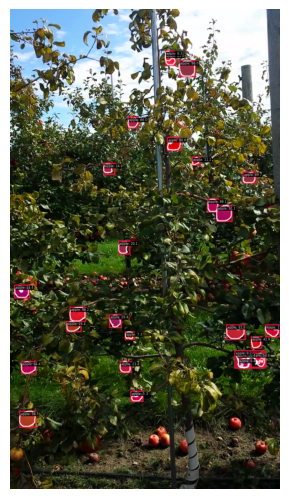

In [ ]:
# init visualizer(run the block only once in jupyter notebook)
visualizer = VISUALIZERS.build(model.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_detector
visualizer.dataset_meta = model.dataset_meta

# show the results
visualizer.add_datasample(
    'result',
    image,
    data_sample=result,
    draw_gt = False,
    wait_time=0,
    pred_score_thr=0.05
)
visualizer.show()